In [52]:
import json
import pandas as pd
import geopandas as gpd

In [53]:
import requests

url = "http://localhost:8989/isochrone"

query = {
  "point": "52.4807,13.3635",
  "time_limit": "600",
  "distance_limit": "0",
  "profile": "car",
  "buckets": "1",
  "reverse_flow": "false",
}

response = requests.get(url, params=query)

data = response.json()
#print(data) 

In [10]:
pretty_json = json.loads(response.text)


In [14]:
df = pd.json_normalize(pretty_json['polygons'])

In [ ]:
df = pd.json_normalize(pretty_json['polygons'])

In [15]:
df

,type,geometry.type,geometry.coordinates,properties.bucket
0,Feature,Polygon,"[[[13.4179002, 52.4500317], [13.41864835, 52.4...",0


In [19]:
gdf = gpd.GeoDataFrame.from_features(pretty_json["polygons"])

<Axes: >

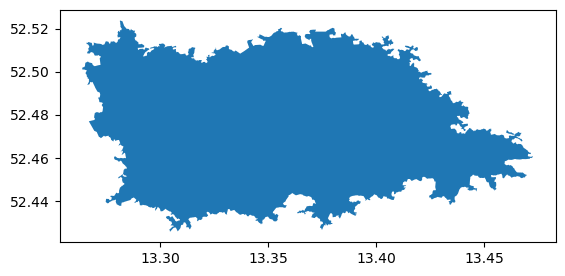

In [22]:
gdf.plot()

------

In [60]:
import requests

url = "http://localhost:8989/isochrone"

query = {
  "point": "52.4807,13.3635",
  "time_limit": "600",
  "distance_limit": "0",
  "profile": "bike",
  "buckets": "10",
  "reverse_flow": "false",
}

response = requests.get(url, params=query)

data = response.json()
#print(data) 

In [61]:
pretty_json = json.loads(response.text)
gdf = gpd.GeoDataFrame.from_features(pretty_json["polygons"])

In [62]:
gdf

,geometry,bucket
0,"POLYGON ((13.36305 52.48014, 13.36349 52.48019...",0
1,"POLYGON ((13.36305 52.48014, 13.36300 52.47963...",1
2,"POLYGON ((13.36305 52.48014, 13.36300 52.47963...",2
3,"POLYGON ((13.36136 52.48188, 13.36131 52.48188...",3
4,"POLYGON ((13.36391 52.47833, 13.36392 52.47829...",4
5,"POLYGON ((13.36081 52.47972, 13.36082 52.47970...",5
6,"POLYGON ((13.36335 52.47661, 13.36331 52.47653...",6
7,"POLYGON ((13.36212 52.47850, 13.36251 52.47813...",7
8,"POLYGON ((13.36212 52.47850, 13.36251 52.47813...",8
9,"POLYGON ((13.36212 52.47850, 13.36251 52.47813...",9


In [63]:
gdf.crs=4326
gdf_plot = gdf.to_crs(3857)

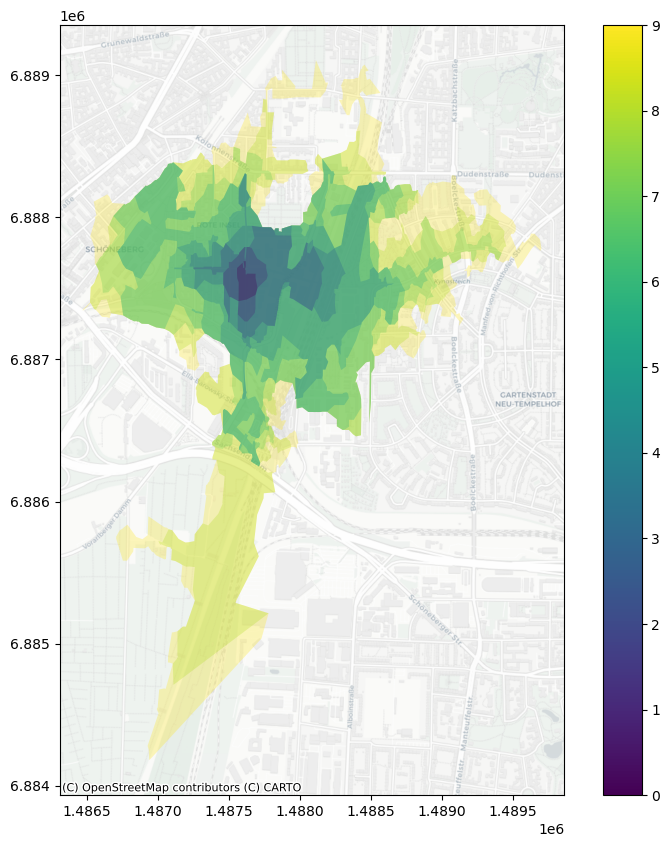

In [65]:
import contextily as ctx


ax=gdf_plot.sort_values("bucket", ascending=False).plot(column='bucket', legend=True, alpha=0.3, figsize=(10,10))

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron) 


In [ ]:
#######

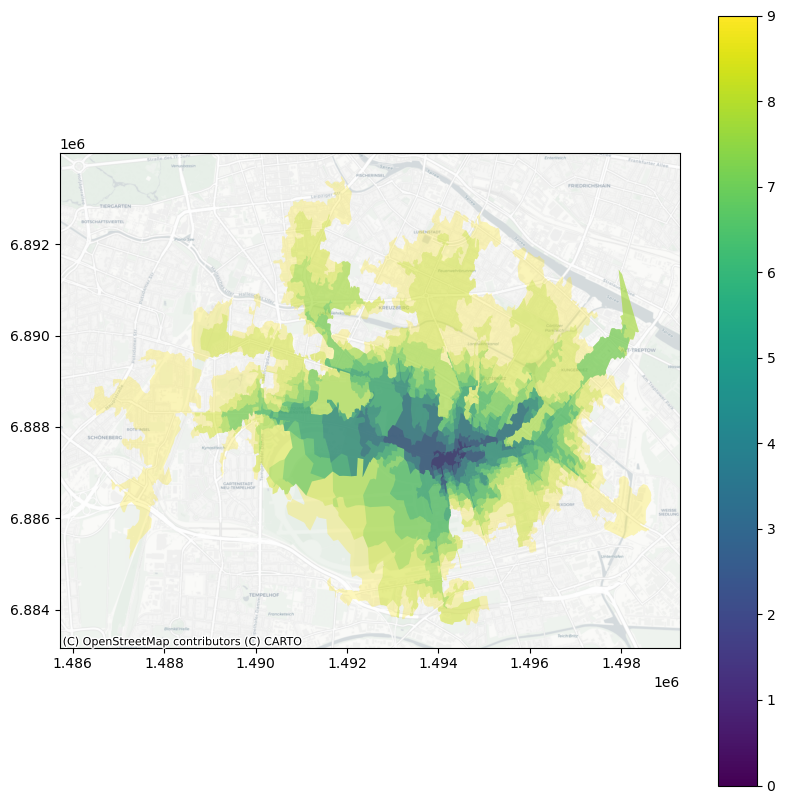

In [67]:
import requests

url = "http://localhost:8989/isochrone"

query = {
  "point": "52.4797,13.4221",
  "time_limit": "1200",
  "distance_limit": "0",
  "profile": "bike",
  "buckets": "10",
  "reverse_flow": "false",
}

response = requests.get(url, params=query)

data = response.json()

# response to gdf
pretty_json = json.loads(response.text)
gdf = gpd.GeoDataFrame.from_features(pretty_json["polygons"])


#transform crs
gdf.crs=4326
gdf_plot = gdf.to_crs(3857)

#plotting
ax=gdf_plot.sort_values("bucket", ascending=False).plot(column='bucket', legend=True, alpha=0.3, figsize=(10,10))
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron) 

In [ ]:
def calcTimeBuckets(bucket, time_limit, buckets_no):
    
    time_per_bucket=(time_limit/buckets_no)/60
    
    bucket+=1
    timebucket=bucket*time_per_bucket
    
    return timebucket

Text(0.5, 1.01, 'GH localhost Isochones \n Start:Schillerkiez; custom profil bike (average_slope)')

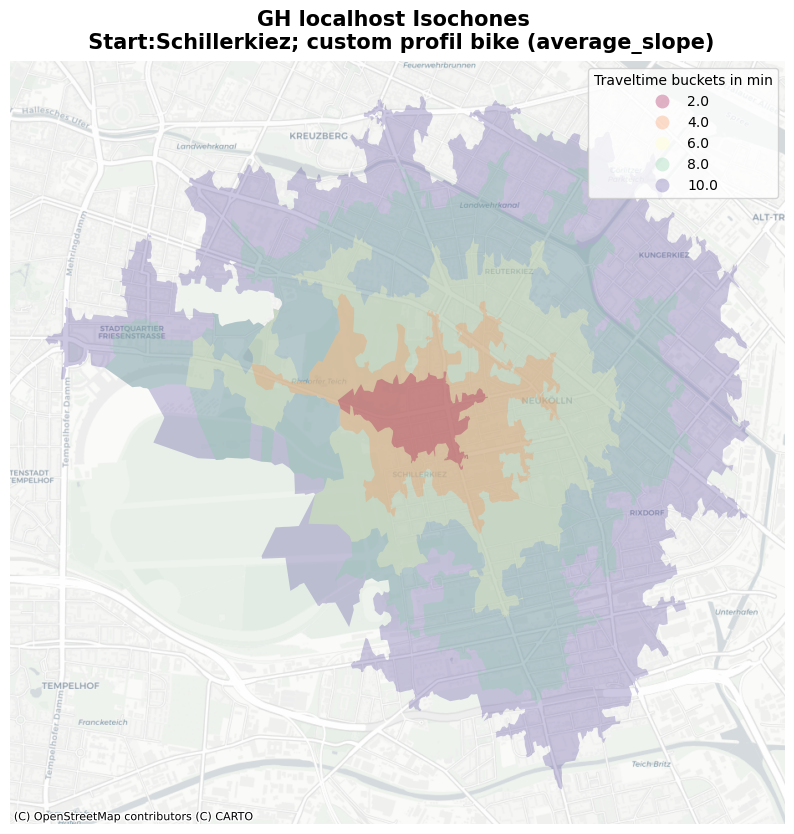

In [127]:
import requests

url = "http://localhost:8989/isochrone"


time_limit=10*60
buckets=5

query = {
  "point": "52.4797,13.4221",
  "time_limit": str(time_limit),
  "distance_limit": "0",
  "profile": "bike",
  "buckets": str(buckets),
  "reverse_flow": "false",
}

response = requests.get(url, params=query)

data = response.json()

# response to gdf
pretty_json = json.loads(response.text)
gdf = gpd.GeoDataFrame.from_features(pretty_json["polygons"])

#prepare time_buckets for plotting
gdf['time_bucket']=gdf.bucket.apply(lambda x: calcTimeBuckets(x,time_limit,buckets))

#transform crs
gdf.crs=4326
gdf_plot = gdf.to_crs(3857)

#plotting
ax=gdf_plot.sort_values("time_bucket", ascending=False).plot(
    #title="GH localhost Isochones - Start:Schillerkiez; profile bike (average_slope)",
    column='time_bucket', categorical=True, 
    cmap='Spectral', legend=True, alpha=0.3, figsize=(10,10),
    legend_kwds={'title': "Traveltime buckets in min"})
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

ax.axis('off')

ax.text(x=0.5, y=1.01, s='GH localhost Isochones \n Start:Schillerkiez; custom profil bike (average_slope)', fontsize=15, weight='bold', ha='center', va='bottom', transform=ax.transAxes)

In [80]:
#gdf['time_bucket']=gdf.bucket.apply(lambda x: calcTimeBuckets(x,1200,10))

In [71]:
response.url

'http://localhost:8989/isochrone?point=52.4797%2C13.4221&time_limit=1200&distance_limit=0&profile=bike&buckets=10&reverse_flow=false'

In [68]:
gdf.to_file("bike_1200s_10b_schillerkiez.geojson", driver="GeoJSON") 

Text(0.5, 1.01, 'GH localhost Isochones \n Start:Schillerkiez; custom profil car (ohne Autobahn)')

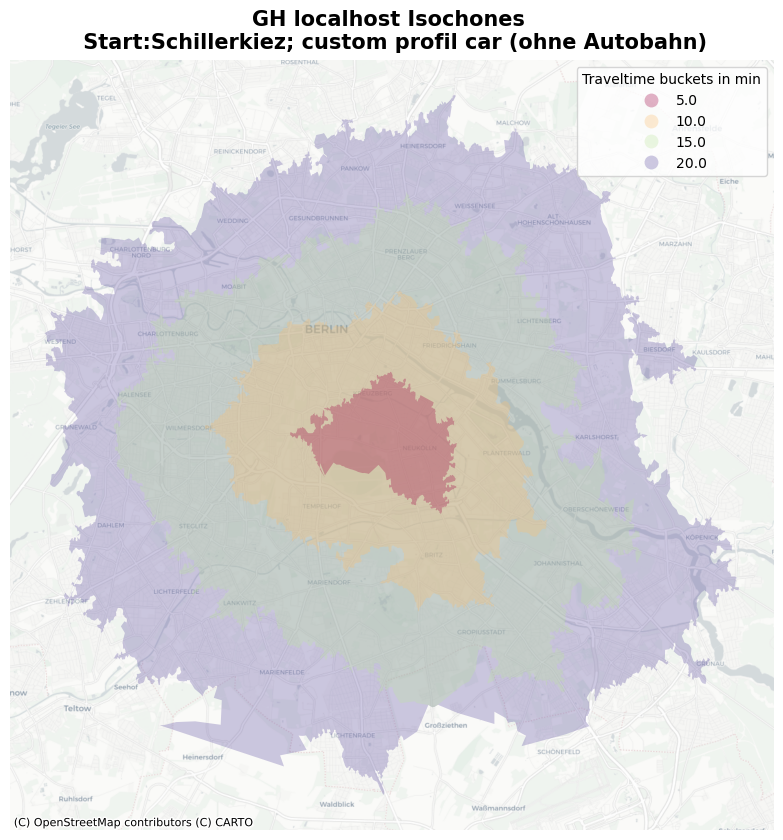

In [104]:
import requests

url = "http://localhost:8989/isochrone"


time_limit=20*60
buckets=4

query = {
  "point": "52.4797,13.4221",
  "time_limit": str(time_limit),
  "distance_limit": "0",
  "profile": "car",
  "buckets": str(buckets),
  "reverse_flow": "false",
}

response = requests.get(url, params=query)

data = response.json()

# response to gdf
pretty_json = json.loads(response.text)
gdf = gpd.GeoDataFrame.from_features(pretty_json["polygons"])

#prepare time_buckets for plotting
gdf['time_bucket']=gdf.bucket.apply(lambda x: calcTimeBuckets(x,time_limit,buckets))

#transform crs
gdf.crs=4326
gdf_plot = gdf.to_crs(3857)

#plotting
ax=gdf_plot.sort_values("time_bucket", ascending=False).plot(
    #title="GH localhost Isochones - Start:Schillerkiez; profile bike (average_slope)",
    column='time_bucket', categorical=True, 
    cmap='Spectral', legend=True, alpha=0.3, figsize=(10,10),
    legend_kwds={'title': "Traveltime buckets in min"})
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

ax.axis('off')

ax.text(x=0.5, y=1.01, s='GH localhost Isochones \n Start:Schillerkiez; custom profil car (ohne Autobahn)', fontsize=15, weight='bold', ha='center', va='bottom', transform=ax.transAxes)

## Attraktionspunkte

#### Population

In [114]:
pop_raster_poly= gpd.read_file('../bolt_data/pop_100m_2011_berlin.gpkg', layer='poly')

In [111]:
pop_raster.crs

<Projected CRS: EPSG:3035>
Name: ETRS89-extended / LAEA Europe
Axis Info [cartesian]:
- Y[north]: Northing (metre)
- X[east]: Easting (metre)
Area of Use:
- name: Europe - European Union (EU) countries and candidates. Europe - onshore and offshore: Albania; Andorra; Austria; Belgium; Bosnia and Herzegovina; Bulgaria; Croatia; Cyprus; Czechia; Denmark; Estonia; Faroe Islands; Finland; France; Germany; Gibraltar; Greece; Hungary; Iceland; Ireland; Italy; Kosovo; Latvia; Liechtenstein; Lithuania; Luxembourg; Malta; Monaco; Montenegro; Netherlands; North Macedonia; Norway including Svalbard and Jan Mayen; Poland; Portugal including Madeira and Azores; Romania; San Marino; Serbia; Slovakia; Slovenia; Spain including Canary Islands; Sweden; Switzerland; Turkey; United Kingdom (UK) including Channel Islands and Isle of Man; Vatican City State.
- bounds: (-35.579299533, 24.603629139001, 44.820545196533, 84.722623821813)
Coordinate Operation:
- name: Europe Equal Area 2001
- method: Lambert Azi

In [115]:
pop_raster_cent=pop_raster_poly.copy()
pop_raster_cent.geometry=pop_raster.centroid

<Axes: >

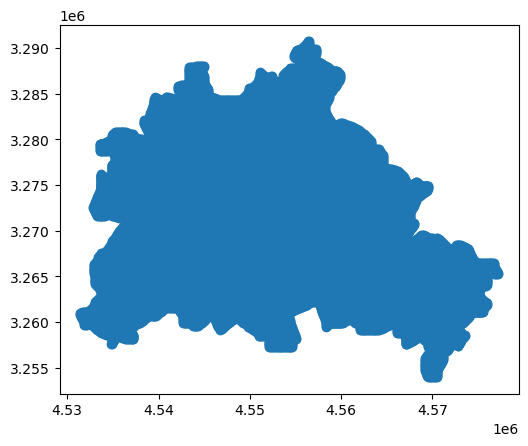

In [116]:
pop_raster_cent.plot()


In [117]:
#https://overpass-turbo.eu/s/1sBg
bars= gpd.read_file('export_bar-pub_berlin.geojson')

<Axes: >

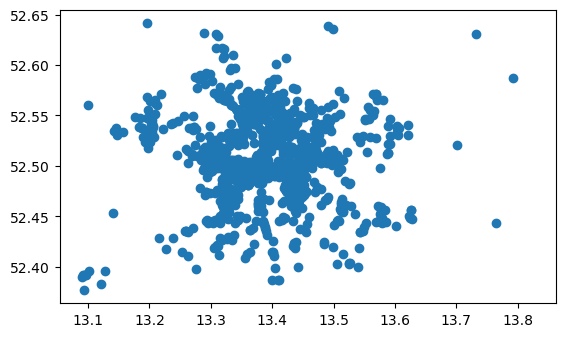

In [118]:
bars.plot()

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax)

bland = gpd.read_file("https://raw.githubusercontent.com/isellsoap/deutschlandGeoJSON/main/2_bundeslaender/1_sehr_hoch.geo.json")
bland.boundary.plot(ax=ax, color='gray')

In [ ]:
## layered

In [120]:
#bars= gpd.read_file('export_bar-pub_berlin.geojson')

Text(0.5, 1.01, 'GH localhost Isochones \n Start:Schillerkiez; custom profil car (ohne Autobahn)')

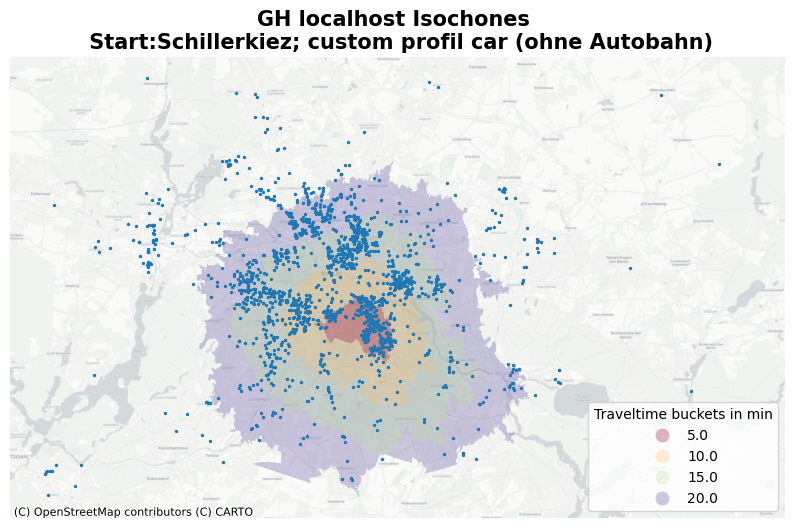

In [126]:
ax=gdf_plot.sort_values("time_bucket", ascending=False).plot(
    #title="GH localhost Isochones - Start:Schillerkiez; profile bike (average_slope)",
    column='time_bucket', categorical=True, 
    cmap='Spectral', legend=True, alpha=0.3, figsize=(10,10),
    legend_kwds={'title': "Traveltime buckets in min"})

bars_plot = bars.to_crs(3857)
bars_plot.plot(ax=ax, markersize=2)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis('off')

ax.text(x=0.5, y=1.01, s='GH localhost Isochones \n Start:Schillerkiez; custom profil car (ohne Autobahn)', fontsize=15, weight='bold', ha='center', va='bottom', transform=ax.transAxes)

In [ ]:
### hexas
# siehe anderes ipynb

In [129]:
hex_res9_nnk= gpd.read_file('hex_res9_nnk.gpkg', driver='GPKG') 

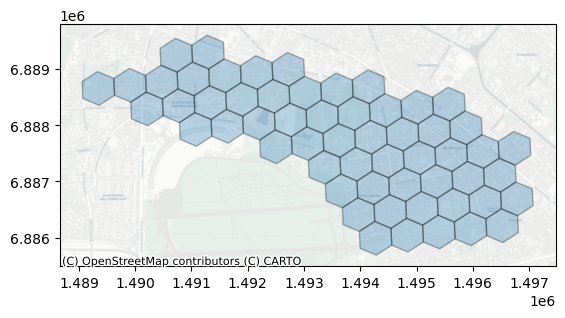

In [138]:
ax=hex_res9_nnk.plot(alpha=0.3, edgecolor='k')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)


In [139]:
hex_res9_nnk_cent=hex_res9_nnk.copy()
hex_res9_nnk_cent.geometry=hex_res9_nnk.centroid

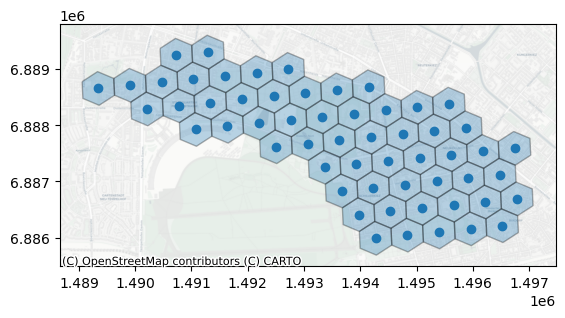

In [140]:
hex_res9_nnk_cent

ax=hex_res9_nnk.plot(alpha=0.3, edgecolor='k')
hex_res9_nnk_cent.plot(ax=ax)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

In [142]:
hex_res9_nnk_cent_4326 = hex_res9_nnk_cent.to_crs(4326)

In [143]:
hex_res9_nnk_cent_4326

,hex_id,geometry
0,891f18b21a3ffff,POINT (13.44040 52.48081)
1,891f18b2133ffff,POINT (13.44077 52.47590)
2,891f18b21d3ffff,POINT (13.41514 52.47927)
3,891f18b2577ffff,POINT (13.41710 52.48679)
4,891f18b256bffff,POINT (13.41242 52.48158)
5,891f18b2557ffff,POINT (13.40429 52.48848)
6,891f18b2197ffff,POINT (13.42992 52.48511)
7,891f18b2427ffff,POINT (13.39418 52.48786)
8,891f18b21bbffff,POINT (13.43535 52.48050)
9,891f18b21c7ffff,POINT (13.42290 52.47728)


In [187]:
import requests
from tqdm import tqdm

gdf_all=gpd.GeoDataFrame()

url = "http://localhost:8989/isochrone"


time_limit=10*60
buckets=5

for index, row in tqdm(hex_res9_nnk_cent_4326.iterrows()):
    #print (row['geometry'].x)
    query = {
      "point": str(str(row['geometry'].y)+","+str(row['geometry'].x)),
      "time_limit": str(time_limit),
      "distance_limit": "0",
      "profile": "bike",
      "buckets": str(buckets),
      "reverse_flow": "false",
    }

    response = requests.get(url, params=query)

    data = response.json()

    # response to gdf
    pretty_json = json.loads(response.text)
    gdf = gpd.GeoDataFrame.from_features(pretty_json["polygons"])

    #prepare time_buckets for plotting
    gdf['time_bucket']=gdf.bucket.apply(lambda x: calcTimeBuckets(x,time_limit,buckets))
    
    gdf['hex_id']=row['hex_id']
    
    gdf_all=gdf_all.append(gdf)
    
    



57it [02:15,  2.39s/it]


In [188]:
gdf_all.crs=4326

In [189]:
gdf_all

,geometry,bucket,time_bucket,hex_id
0,"POLYGON ((13.43873 52.48022, 13.43875 52.48020...",0,2.0,891f18b21a3ffff
1,"POLYGON ((13.44796 52.48314, 13.44760 52.48333...",1,4.0,891f18b21a3ffff
2,"POLYGON ((13.43262 52.47597, 13.43294 52.47579...",2,6.0,891f18b21a3ffff
3,"POLYGON ((13.45804 52.47946, 13.45834 52.48022...",3,8.0,891f18b21a3ffff
4,"POLYGON ((13.42819 52.47212, 13.42821 52.47183...",4,10.0,891f18b21a3ffff
...,...,...,...,...
0,"POLYGON ((13.39583 52.49277, 13.39494 52.49286...",0,2.0,891f18b25cbffff
1,"POLYGON ((13.39661 52.49348, 13.39575 52.49366...",1,4.0,891f18b25cbffff
2,"POLYGON ((13.40489 52.49082, 13.40484 52.49085...",2,6.0,891f18b25cbffff
3,"POLYGON ((13.38478 52.48838, 13.38467 52.48833...",3,8.0,891f18b25cbffff


In [190]:
bars['isBar']=1

In [191]:
dfsjoin = gpd.sjoin(gdf_all, bars[['geometry','isBar']]) #Spatial join Points to polygons

In [192]:
dfpivot = pd.pivot_table(dfsjoin,index=['hex_id','time_bucket'],columns='isBar',aggfunc={'isBar':len})
dfpivot.columns = dfpivot.columns.droplevel()

#dfpolynew = polys.merge(dfpivot, how='left', on='hex_id')

In [193]:
dfpivot=dfpivot.reset_index().rename(columns={1: "cnt"})

In [194]:
dfpivot

isBar,hex_id,time_bucket,cnt
0,891f18b2097ffff,4.0,5
1,891f18b2097ffff,6.0,28
2,891f18b2097ffff,8.0,53
3,891f18b2097ffff,10.0,83
4,891f18b20b7ffff,6.0,1
...,...,...,...
229,891f1d4d24bffff,2.0,15
230,891f1d4d24bffff,4.0,58
231,891f1d4d24bffff,6.0,111
232,891f1d4d24bffff,8.0,189


In [195]:
def calcCoeff(time_bucket,cnt):  
    if time_bucket==2:
        coeff=cnt*2
    if time_bucket==4:
        coeff=cnt*0.8
    if time_bucket==6:
        coeff=cnt*0.6
    if time_bucket==8:
        coeff=cnt*0.4
    if time_bucket==10:
        coeff=cnt*0.2
        
    return coeff
    

In [196]:
dfpivot['coeff']=dfpivot.apply(lambda x: calcCoeff(x.time_bucket,x.cnt), axis=1)
dfpivot

isBar,hex_id,time_bucket,cnt,coeff
0,891f18b2097ffff,4.0,5,4.0
1,891f18b2097ffff,6.0,28,16.8
2,891f18b2097ffff,8.0,53,21.2
3,891f18b2097ffff,10.0,83,16.6
4,891f18b20b7ffff,6.0,1,0.6
...,...,...,...,...
229,891f1d4d24bffff,2.0,15,30.0
230,891f1d4d24bffff,4.0,58,46.4
231,891f1d4d24bffff,6.0,111,66.6
232,891f1d4d24bffff,8.0,189,75.6


In [197]:
dfpivot

isBar,hex_id,time_bucket,cnt,coeff
0,891f18b2097ffff,4.0,5,4.0
1,891f18b2097ffff,6.0,28,16.8
2,891f18b2097ffff,8.0,53,21.2
3,891f18b2097ffff,10.0,83,16.6
4,891f18b20b7ffff,6.0,1,0.6
...,...,...,...,...
229,891f1d4d24bffff,2.0,15,30.0
230,891f1d4d24bffff,4.0,58,46.4
231,891f1d4d24bffff,6.0,111,66.6
232,891f1d4d24bffff,8.0,189,75.6


In [198]:
dfpivot_hex = pd.pivot_table(dfpivot,index='hex_id',aggfunc={'coeff':sum}).reset_index()
dfpivot_hex

isBar,hex_id,coeff
0,891f18b2097ffff,58.6
1,891f18b20b7ffff,21.8
2,891f18b2103ffff,160.0
3,891f18b2107ffff,182.8
4,891f18b210bffff,177.2
5,891f18b210fffff,1.2
6,891f18b2113ffff,173.6
7,891f18b2117ffff,174.0
8,891f18b211bffff,147.6
9,891f18b2123ffff,150.4


In [200]:
hex_res9_nnk_merged=hex_res9_nnk.merge(dfpivot_hex)

<Axes: >

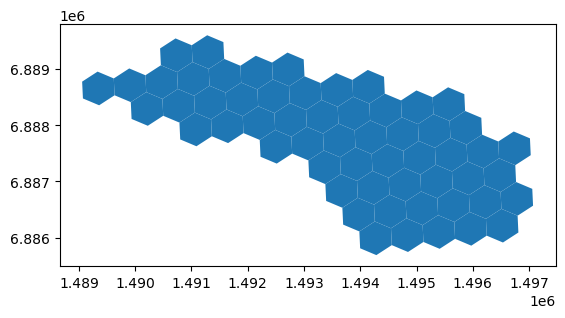

In [201]:
hex_res9_nnk_merged.plot()

In [203]:
import matplotlib.pyplot as plt

Text(0.5, 1.0, 'Erreichbarkeiten von Kneipen mit dem Fahrrad \n Gewichtet nach Anzahl innerhalb von 2,4,6,8 und 10min')

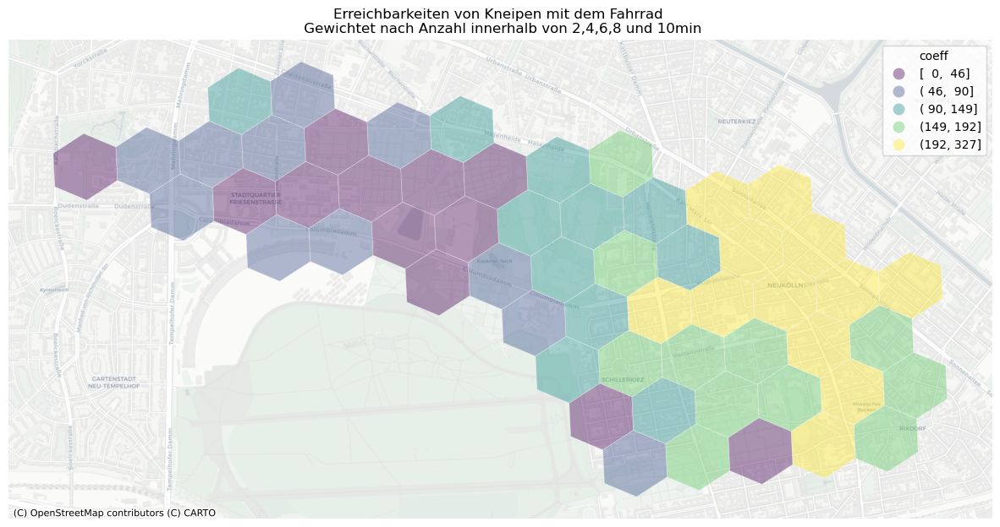

In [208]:
fig, ax = plt.subplots(1, figsize=(15, 15))

res_plot=hex_res9_nnk_merged.to_crs(epsg=3857)
#shape=shape.to_crs(epsg=3857)


res_plot.plot(ax=ax, column='coeff', alpha=0.4, linewidth=0.5, edgecolor='white', legend=True, scheme='quantiles', k=5, 
              legend_kwds={'title': 'coeff','fmt': "{:.0f}",'interval': True})
#tracts.plot(column='CRIME', scheme='quantiles', k=3, cmap='OrRd', edgecolor='k', legend=True)

#shape.plot(ax=ax, alpha=0.2, linewidth=1.6, edgecolor='black', color='gray')


ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis('off')

#legend = plt.legend(title="title" )
#legend1 = ax.legend(title="Concentration\n(Multiples of\nlimit value)")

#ax.legend(title='location')
#ax.legend(title='Einwohner')
ax.set_title('Erreichbarkeiten von Kneipen mit dem Fahrrad \n Gewichtet nach Anzahl innerhalb von 2,4,6,8 und 10min')

In [213]:
gdf_all_dissolve=gdf_all.dissolve()

In [217]:
bars_clipped=gpd.clip(bars[['geometry','isBar']],gdf_all_dissolve)

<Axes: >

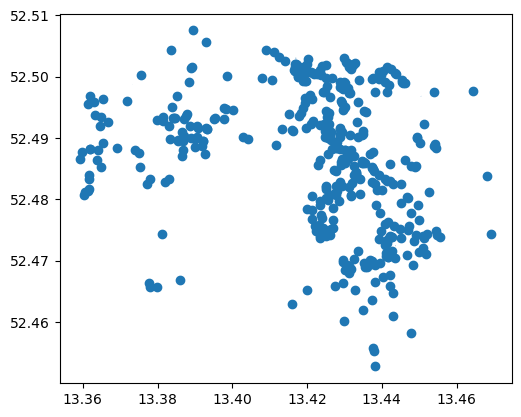

In [218]:
bars_clipped.plot()

Text(0.5, 1.0, 'Erreichbarkeiten von Kneipen mit dem Fahrrad \n Gewichtet nach Anzahl innerhalb von 2,4,6,8 und 10min')

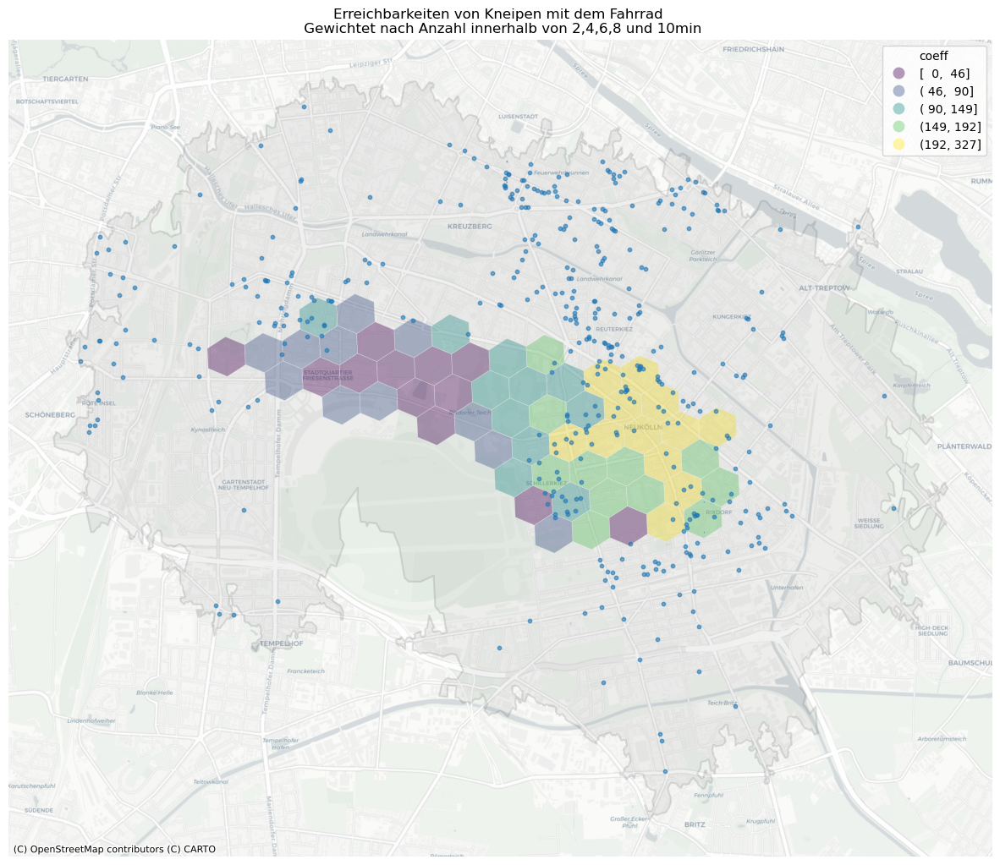

In [222]:
fig, ax = plt.subplots(1, figsize=(15, 15))

res_plot=hex_res9_nnk_merged.to_crs(epsg=3857)
shape_plot=gdf_all_dissolve.to_crs(epsg=3857)
bars_plot=bars_clipped.to_crs(epsg=3857)


res_plot.plot(ax=ax, column='coeff', alpha=0.4, linewidth=0.5, edgecolor='white', legend=True, scheme='quantiles', k=5, 
              legend_kwds={'title': 'coeff','fmt': "{:.0f}",'interval': True})
#tracts.plot(column='CRIME', scheme='quantiles', k=3, cmap='OrRd', edgecolor='k', legend=True)

shape_plot.plot(ax=ax, alpha=0.1, linewidth=1.6, edgecolor='black', color='gray')
bars_plot.plot(ax=ax, alpha=0.6, markersize=10)


ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.axis('off')

#legend = plt.legend(title="title" )
#legend1 = ax.legend(title="Concentration\n(Multiples of\nlimit value)")

#ax.legend(title='location')
#ax.legend(title='Einwohner')
ax.set_title('Erreichbarkeiten von Kneipen mit dem Fahrrad \n Gewichtet nach Anzahl innerhalb von 2,4,6,8 und 10min')

In [227]:
gdf_iso_schiller=gdf_all[gdf_all['hex_id']=='891f18b218bffff']#.plot()

Text(0.5, 1.0, 'Erreichbarkeiten von Kneipen mit dem Fahrrad \n Gewichtet nach Anzahl innerhalb von 2,4,6,8 und 10min \n Beispiel für eine Start-Kachel')

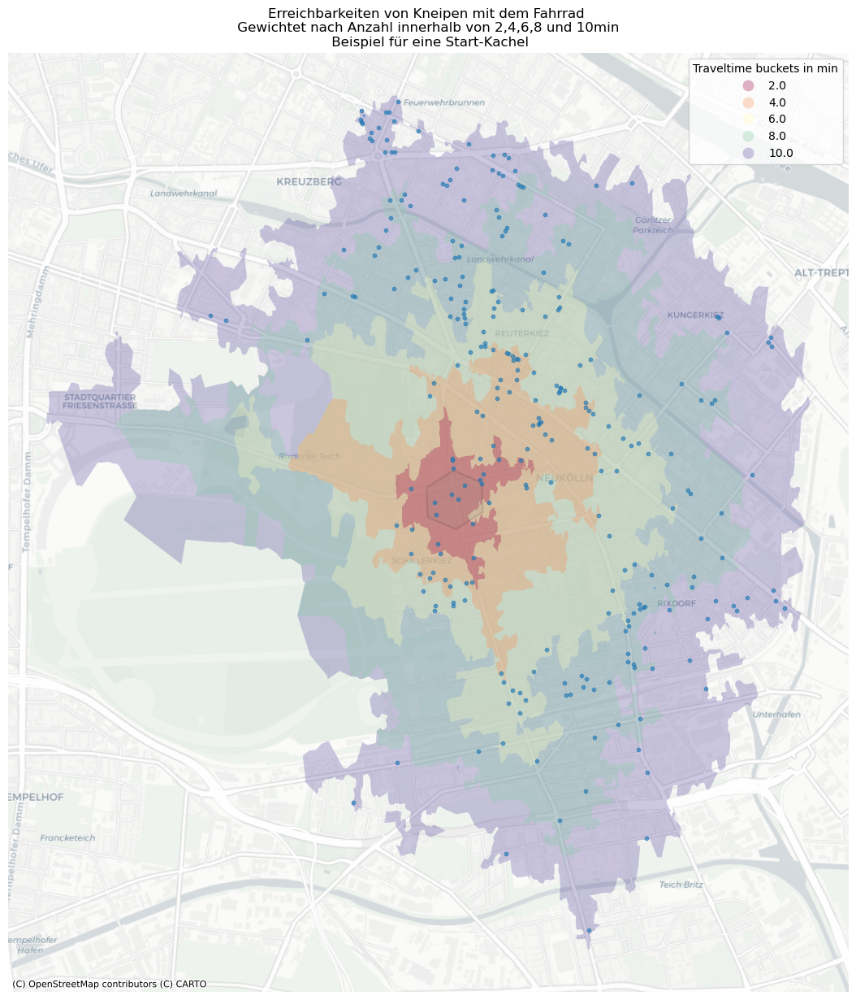

In [236]:

fig, ax = plt.subplots(1, figsize=(15, 15))

#transform crs
bars_clipped_this=gpd.clip(bars[['geometry','isBar']],gdf_iso_schiller)
bars_plot=bars_clipped_this.to_crs(epsg=3857)

gdf_plot = gdf_iso_schiller.to_crs(3857)

hex_plot=hex_res9_nnk_merged[hex_res9_nnk_merged['hex_id']=='891f18b218bffff'].to_crs(epsg=3857)





#plotting
ax=gdf_plot.sort_values("time_bucket", ascending=False).plot(ax=ax,
    #title="GH localhost Isochones - Start:Schillerkiez; profile bike (average_slope)",
    column='time_bucket', categorical=True, 
    cmap='Spectral', legend=True, alpha=0.3, figsize=(10,10),
    legend_kwds={'title': "Traveltime buckets in min"})

hex_plot.plot(ax=ax, alpha=0.1, linewidth=1.6, edgecolor='black', color='gray')
bars_plot.plot(ax=ax, alpha=0.6, markersize=10)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

ax.axis('off')

ax.set_title('Erreichbarkeiten von Kneipen mit dem Fahrrad \n Gewichtet nach Anzahl innerhalb von 2,4,6,8 und 10min \n Beispiel für eine Start-Kachel')

In [239]:
from pandas.plotting import table
import numpy as np

In [242]:
dfpivot[dfpivot.hex_id=="891f18b218bffff"]

isBar,hex_id,time_bucket,cnt,coeff
68,891f18b218bffff,2.0,17,34.0
69,891f18b218bffff,4.0,64,51.2
70,891f18b218bffff,6.0,120,72.0
71,891f18b218bffff,8.0,205,82.0
72,891f18b218bffff,10.0,272,54.4


In [ ]:
x=0.5, y=1.01,

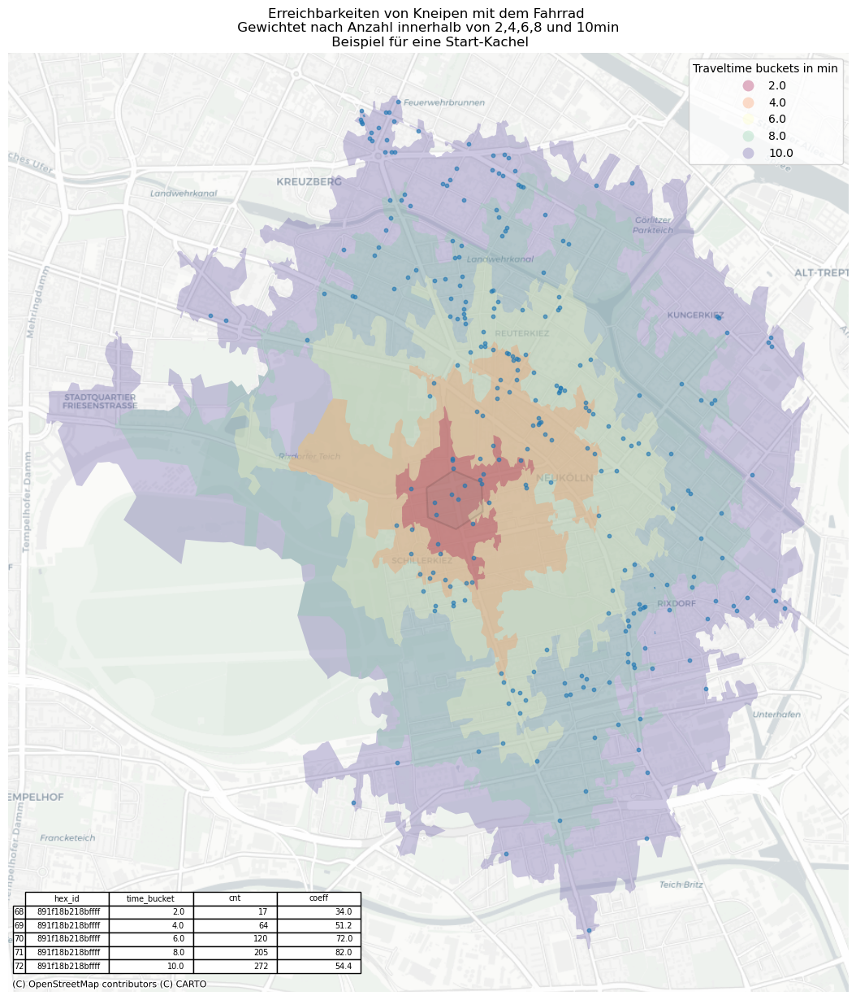

In [261]:

fig, ax = plt.subplots(1,1, figsize=(15, 15))

#table
#table(ax, np.round(dfpivot[dfpivot.hex_id=="891f18b218bffff"].describe(), 2), loc="upper right", colWidths=[0.2, 0.2, 0.2, 0.2]);
#table(ax, np.round(dfpivot[dfpivot.hex_id=="891f18b218bffff"], 1), loc="upper right", colWidths=[0.2, 0.2, 0.2, 0.2]);



#transform crs
bars_clipped_this=gpd.clip(bars[['geometry','isBar']],gdf_iso_schiller)
bars_plot=bars_clipped_this.to_crs(epsg=3857)

gdf_plot = gdf_iso_schiller.to_crs(3857)

hex_plot=hex_res9_nnk_merged[hex_res9_nnk_merged['hex_id']=='891f18b218bffff'].to_crs(epsg=3857)





#plotting
ax=gdf_plot.sort_values("time_bucket", ascending=False).plot(ax=ax,
    #title="GH localhost Isochones - Start:Schillerkiez; profile bike (average_slope)",
    column='time_bucket', categorical=True, 
    cmap='Spectral', legend=True, alpha=0.3, figsize=(10,10),
    legend_kwds={'title': "Traveltime buckets in min"})

hex_plot.plot(ax=ax, alpha=0.1, linewidth=1.6, edgecolor='black', color='gray')
bars_plot.plot(ax=ax, alpha=0.6, markersize=10)

ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

table(ax, np.round(dfpivot[dfpivot.hex_id=="891f18b218bffff"], 1), loc="lower left", colWidths=[0.1, 0.1, 0.1, 0.1]);


ax.axis('off')

ax.set_title('Erreichbarkeiten von Kneipen mit dem Fahrrad \n Gewichtet nach Anzahl innerhalb von 2,4,6,8 und 10min \n Beispiel für eine Start-Kachel')

plt.show()

In [ ]:
###### interaktive viz

In [262]:
import altair as alt

In [267]:
#hex_res9_nnk_merged

In [334]:
gdf_iso_schiller

,geometry,bucket,time_bucket,hex_id
0,"POLYGON ((13.42724 52.47884, 13.42721 52.47883...",0,2.0,891f18b218bffff
1,"POLYGON ((13.42505 52.47493, 13.42505 52.47494...",1,4.0,891f18b218bffff
2,"POLYGON ((13.42857 52.47162, 13.42866 52.47161...",2,6.0,891f18b218bffff
3,"POLYGON ((13.41383 52.48529, 13.41362 52.48513...",3,8.0,891f18b218bffff
4,"POLYGON ((13.40897 52.47687, 13.40940 52.47655...",4,10.0,891f18b218bffff


In [338]:
gdf_iso_schiller.sort_values('time_bucket', ascending=False)

,geometry,bucket,time_bucket,hex_id
4,"POLYGON ((13.40897 52.47687, 13.40940 52.47655...",4,10.0,891f18b218bffff
3,"POLYGON ((13.41383 52.48529, 13.41362 52.48513...",3,8.0,891f18b218bffff
2,"POLYGON ((13.42857 52.47162, 13.42866 52.47161...",2,6.0,891f18b218bffff
1,"POLYGON ((13.42505 52.47493, 13.42505 52.47494...",1,4.0,891f18b218bffff
0,"POLYGON ((13.42724 52.47884, 13.42721 52.47883...",0,2.0,891f18b218bffff


In [386]:
subtraction_gdf=gdf_iso_schiller.sort_values('time_bucket', ascending=False).reset_index().copy()

In [387]:
subtraction_gdf

,index,geometry,bucket,time_bucket,hex_id
0,4,"POLYGON ((13.40897 52.47687, 13.40940 52.47655...",4,10.0,891f18b218bffff
1,3,"POLYGON ((13.41383 52.48529, 13.41362 52.48513...",3,8.0,891f18b218bffff
2,2,"POLYGON ((13.42857 52.47162, 13.42866 52.47161...",2,6.0,891f18b218bffff
3,1,"POLYGON ((13.42505 52.47493, 13.42505 52.47494...",1,4.0,891f18b218bffff
4,0,"POLYGON ((13.42724 52.47884, 13.42721 52.47883...",0,2.0,891f18b218bffff


In [410]:

## dougnutting for one

from shapely.geometry import Polygon

subtraction_gdf=gdf_iso_schiller.sort_values('time_bucket', ascending=False).reset_index().copy()

for index,row in subtraction_gdf.iterrows():
    if index+1 < len(subtraction_gdf):
        print (index)
        geom1 = subtraction_gdf.loc[index, 'geometry']
        geom2 = subtraction_gdf.loc[index+1, 'geometry']
        
        subtraction_gdf.at[index, 'geometry'] = geom1.difference(geom2) 


0
1
2
3


<Axes: >

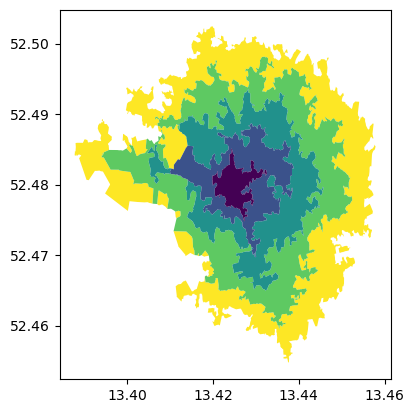

In [414]:
subtraction_gdf.plot(column="time_bucket")

In [ ]:
## dougnutting for all

In [424]:
gdf_all.bucket.max()

4

In [452]:
subtraction_gdf_all[:10]

,index,geometry,bucket,time_bucket,hex_id
0,4,"MULTIPOLYGON (((13.40533 52.48929, 13.40521 52...",4,10.0,891f1d4d24bffff
1,3,"MULTIPOLYGON (((13.42322 52.48496, 13.42327 52...",3,8.0,891f1d4d24bffff
2,2,"MULTIPOLYGON (((13.42242 52.48683, 13.42232 52...",2,6.0,891f1d4d24bffff
3,1,"POLYGON ((13.42435 52.48691, 13.42436 52.48690...",1,4.0,891f1d4d24bffff
4,0,"POLYGON ((13.43526 52.48650, 13.43524 52.48649...",0,2.0,891f1d4d24bffff
5,4,"POLYGON ((13.41216 52.48789, 13.41242 52.48762...",4,10.0,891f18b25cbffff
6,3,"POLYGON ((13.38478 52.48838, 13.38467 52.48833...",3,8.0,891f18b25cbffff
7,2,"POLYGON ((13.40489 52.49082, 13.40484 52.49085...",2,6.0,891f18b25cbffff
8,1,"POLYGON ((13.39661 52.49348, 13.39575 52.49366...",1,4.0,891f18b25cbffff
9,0,"POLYGON ((13.39583 52.49277, 13.39494 52.49286...",0,2.0,891f18b25cbffff


In [455]:
all_hex_ids

array(['891f1d4d24bffff', '891f18b25cbffff', '891f18b257bffff',
       '891f18b2577ffff', '891f18b2573ffff', '891f18b256fffff',
       '891f18b256bffff', '891f18b2567ffff', '891f18b2563ffff',
       '891f18b255bffff', '891f18b2557ffff', '891f18b2553ffff',
       '891f18b254fffff', '891f18b254bffff', '891f18b2547ffff',
       '891f18b2543ffff', '891f18b252bffff', '891f18b250bffff',
       '891f18b243bffff', '891f18b2437ffff', '891f18b242fffff',
       '891f18b242bffff', '891f18b2427ffff', '891f18b2423ffff',
       '891f18b240fffff', '891f18b21d7ffff', '891f18b21d3ffff',
       '891f18b21cfffff', '891f18b21c7ffff', '891f18b21c3ffff',
       '891f18b21bbffff', '891f18b21b3ffff', '891f18b21afffff',
       '891f18b21abffff', '891f18b21a7ffff', '891f18b21a3ffff',
       '891f18b219bffff', '891f18b2197ffff', '891f18b2193ffff',
       '891f18b218fffff', '891f18b218bffff', '891f18b2187ffff',
       '891f18b2183ffff', '891f18b2157ffff', '891f18b213bffff',
       '891f18b2137ffff', '891f18b2133ff

In [469]:
import topojson


In [459]:
from shapely.geometry import Polygon

subtraction_gdf_all=gdf_all.sort_values(['hex_id','time_bucket'], ascending=False).reset_index().copy()

all_hex_ids= subtraction_gdf_all.hex_id.unique()

for hx in all_hex_ids:
    for index,row in subtraction_gdf_all[subtraction_gdf_all.hex_id==hx][:4].iterrows():   # 4 because of 5 time buckets
        
        geom1 = subtraction_gdf_all.loc[index, 'geometry']
        geom2 = subtraction_gdf_all.loc[index+1, 'geometry']

        subtraction_gdf_all.at[index, 'geometry'] = geom1.difference(geom2) 

In [493]:
#kick out empty geom
subtraction_gdf_all=subtraction_gdf_all[~subtraction_gdf_all['geometry'].is_empty].copy()

In [494]:
## alles auf einmal (dauer seeeeehr lang)

subtraction_gdf_all_tj = topojson.Topology(subtraction_gdf_all, prequantize=False, topology=True)
subtraction_gdf_all_tj_sim = subtraction_gdf_all_tj.toposimplify(0.002)
subtraction_gdf_all_tj = subtraction_gdf_all_tj_sim.to_gdf()
subtraction_gdf_all_tj.crs='epsg:4326'

KeyboardInterrupt: 

In [497]:
import topojson
#krs.geometry= krs.buffer(0) #falls repair geometry notwendig\n",

subtraction_gdf_all_tj___all = gpd.GeoDataFrame()

all_hex_ids= subtraction_gdf_all.hex_id.unique()
for hx in all_hex_ids:
    subtraction_gdf_all_tj = topojson.Topology(subtraction_gdf_all[(subtraction_gdf_all.hex_id==hx)], prequantize=False, topology=True)
    subtraction_gdf_all_tj_sim = subtraction_gdf_all_tj.toposimplify(0.0002)
    subtraction_gdf_all_tj = subtraction_gdf_all_tj_sim.to_gdf()
    subtraction_gdf_all_tj.crs='epsg:4326'
    
    subtraction_gdf_all_tj___all=subtraction_gdf_all_tj___all.append(subtraction_gdf_all_tj)

<Axes: >

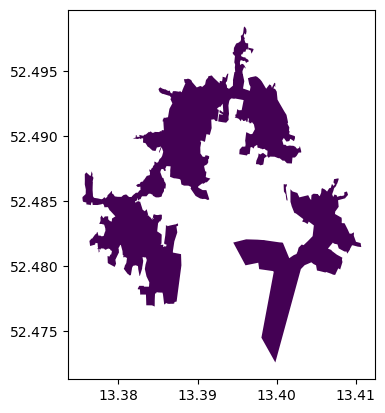

In [498]:
# not simplyfied
subtraction_gdf_all[(subtraction_gdf_all.hex_id=="891f18b2097ffff") & (subtraction_gdf_all.bucket==2)].plot(column="time_bucket")

<Axes: >

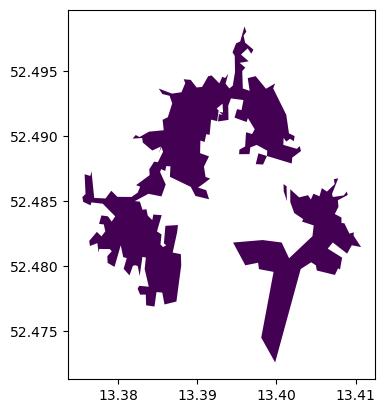

In [499]:
#simplyfied
subtraction_gdf_all_tj___all[(subtraction_gdf_all_tj___all.hex_id=="891f18b2097ffff") & (subtraction_gdf_all_tj___all.bucket==2)].plot(column="time_bucket")

In [ ]:
subtraction_gdf_all_tj___all

<Axes: >

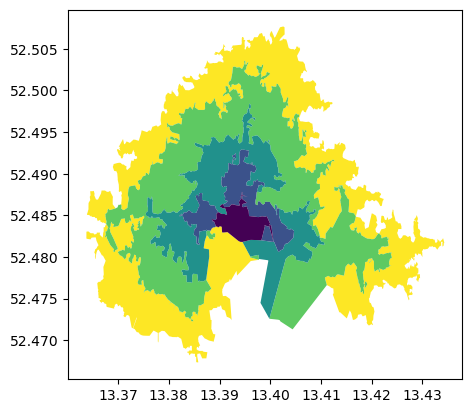

In [461]:
subtraction_gdf_all[(subtraction_gdf_all.hex_id=="891f18b2097ffff")].plot(column="time_bucket")

In [567]:

hex_plot=hex_res9_nnk_merged.copy()
hex_plot.geometry=hex_plot.buffer(0.00000001)
hex_plot=hex_plot.to_crs(epsg=4326)


#points_plot=bars_clipped.copy()
points_plot=gpd.clip(bars[['geometry','isBar']],location_center)
points_plot.geometry=points_plot.centroid
points_plot=points_plot.to_crs(epsg=4326)
points_plot['x']=points_plot.geometry.x
points_plot['y']=points_plot.geometry.y


iso_plot=subtraction_gdf_all_tj___all.copy()
iso_plot.geometry=iso_plot.buffer(0.00000001)



#nearest = alt.selection( fields=['hex_id'], empty=False)
#nearest = alt.selection_point(on='mouseover', nearest=True)
#selection_messpunkt = alt.selection_single(fields=['segment_id'], init={'segment_id':9000004694}, empty='none')

hover = alt.selection(type='single',on='mouseover',
                        fields=['hex_id'], empty='none')

click = alt.selection(type='single',fields=['hex_id'], empty='none')


### HEX
shape_chart=alt.Chart(hex_plot).mark_geoshape(
    stroke='gray',
    #fillOpacity=0,
    #strokeWidth=1.8,
    
    #opacity=0.5,
).encode(
color=alt.Color('coeff:Q',title="Erreichbarkeitskoeffizient"),
tooltip=[
       alt.Tooltip('hex_id', title='hex_id'),
       alt.Tooltip('coeff', title='Erreichbarkeitskoeffizient'),
      # alt.Tooltip('Telraam initiliazed', title='Telraam initiliazed'),
   ],
    
strokeWidth=alt.condition(click, alt.value(3), alt.value(0.6)),
stroke=alt.condition(click, alt.value("black"), alt.value("gray")),
opacity = alt.condition(hover, alt.value(0.8), alt.value(0.6))
).add_selection(
    hover,click
).properties(height=1000, width=1000)



## KNEIPEN
points_chart = alt.Chart(points_plot, title='---').mark_circle(
    color='red', size=30
).encode(    
    longitude='x', 
    latitude='y',
    
    tooltip=[
      # alt.Tooltip('Last name', title='Zählort'),
      # alt.Tooltip('Segment Id and Position', title='ID'),
      # alt.Tooltip('Telraam initiliazed', title='Telraam initiliazed'),
   ],
)


## ISOCHRONEN
iso_chart=alt.Chart(iso_plot).mark_geoshape(
    stroke='lightgray',
    #fillOpacity=0,
    strokeWidth=0.6,
    opacity=0.6
    #opacity=0.5,
).encode(
color=alt.Color('time_bucket:N', scale=alt.Scale(scheme="turbo"))
).transform_filter(
    click
)


full_chrt=(streets_chart+ shape_chart + iso_chart + points_chart ).resolve_scale(
    color='independent'
)

C:\Users\simon\AppData\Local\Temp\ipykernel_13936\3721157022.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  points_plot.geometry=points_plot.centroid
C:\Users\simon\AppData\Local\Temp\ipykernel_13936\3721157022.py:15: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  iso_plot.geometry=iso_plot.buffer(0.00000001)


In [568]:
full_chrt.save('iso_rad_kneipe_simp.html')

In [564]:
full_chrt

alt.LayerChart(...)

In [ ]:
52.4797,13.4194

In [ ]:
## getting streets

In [508]:
df_location_center = pd.DataFrame(
    {'name': ['center'],
     'Latitude': [52.4797],
     'Longitude': [13.4194]})

gdf_location_center = gpd.GeoDataFrame(
    df_location_center, geometry=gpd.points_from_xy(df_location_center.Longitude, df_location_center.Latitude), crs=4326)



<Axes: >

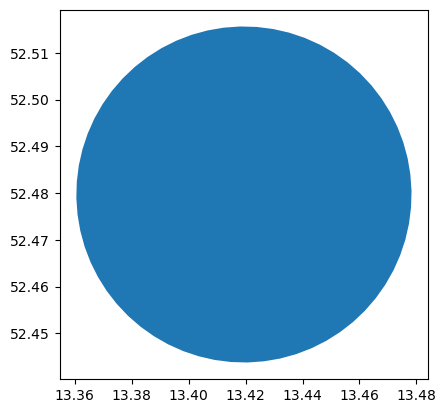

In [531]:
location_center=gdf_location_center.copy()

location_center = location_center.to_crs(epsg=25833) # UTM33

location_center.geometry=location_center.buffer(4000)

location_center = location_center.to_crs("EPSG:4326") 

location_center.plot()

In [532]:
streets= gpd.read_file(r"..\osm_processing\highways_germany_zuNah_v02.gpkg", layer='lines',
                       mask=location_center)

<Axes: >

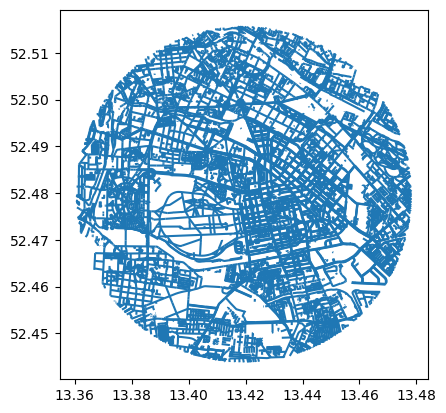

In [533]:
# Create a single polygon object for clipping
poly = location_center.geometry.unary_union
spatial_index = streets.sindex

# Create a box for the initial intersection
bbox = poly.bounds
# Get a list of id's for each road line that overlaps the bounding box and subset the data to just those lines
sidx = list(spatial_index.intersection(bbox))
shp_sub = streets.iloc[sidx]

# Clip the data - with these data
clipped = shp_sub.copy()
clipped['geometry'] = shp_sub.intersection(poly)

# Return the clipped layer with no null geometry values
streets = clipped[clipped.geometry.notnull()]
streets.plot()

In [534]:
for index,row in streets.iterrows():
    try:
        #if row.highway.str.isin(['trunk_link', 'trunk','primary', 'primary_link']):
        if any(row.highway in s for s in ['trunk_link', 'trunk','primary', 'primary_link']):
            streets.at[index, 'weight'] = 100
        if any(row.highway in s for s in ['secondary', 'secondary_link']):
            streets.at[index, 'weight'] = 6
        if any(row.highway in s for s in ['tertiary', 'tertiary_link']):
            streets.at[index, 'weight'] = 3
        if any(row.highway in s for s in ['residential','service','unclassified', 'living_street', 'road']):
            streets.at[index, 'weight'] = 1
    except TypeError:
        print("TypeError: Check list of indices")    
        
streets=streets[streets.highway.isin(['motorway', 'primary', 'secondary', 'motorway_link', 'trunk', 'trunk_link',  'tertiary','primary_link','tertiary_link', 'secondary_link','residential'])].copy()

TypeError: Check list of indices
TypeError: Check list of indices


In [535]:
streets_simp=streets.copy()
streets_simp['geometry']=streets_simp.simplify(0.0001)

In [536]:
streets_chart=alt.Chart(streets_simp[['geometry','weight']]).mark_geoshape(
    #stroke='#144685',
    #stroke='#182627',
    fillOpacity=0,
    #strokeWidth=0.8,
    #color='lightgray',
    opacity=0.8,
    stroke='black'
).encode(strokeWidth=alt.StrokeWidth('weight:Q', legend=None)# 'weight:Q'
        )#.add_selection(
  # dummy
  #  )
streets_chart

alt.Chart(...)

In [141]:
hex_res9_nnk_cent

,hex_id,geometry
0,891f18b21a3ffff,POINT (1496178.475 6887533.180)
1,891f18b2133ffff,POINT (1496219.814 6886635.708)
2,891f18b21d3ffff,POINT (1493366.264 6887252.786)
3,891f18b2577ffff,POINT (1493585.177 6888627.047)
4,891f18b256bffff,POINT (1493064.281 6887673.406)
5,891f18b2557ffff,POINT (1492158.224 6888935.217)
6,891f18b2197ffff,POINT (1495012.121 6888318.613)
7,891f18b2427ffff,POINT (1491033.344 6888822.588)
8,891f18b21bbffff,POINT (1495616.003 6887477.177)
9,891f18b21c7ffff,POINT (1494230.629 6886888.287)


In [28]:
pretty_json

{'polygons': [{'type': 'Feature',
   'geometry': {'type': 'Polygon',
    'coordinates': [[[13.3666959, 52.479185400000006],
      [13.3667217, 52.4793069],
      [13.36746795, 52.4798008],
      [13.367688699999999, 52.4797521],
      [13.3677959, 52.479926500000005],
      [13.36794765, 52.480186700000004],
      [13.367988350000001, 52.4802565],
      [13.368184, 52.4805883],
      [13.368261050000001, 52.4810563],
      [13.36843675, 52.481355449999995],
      [13.3686364, 52.48190135],
      [13.3690838, 52.4821198],
      [13.3699055, 52.4835056],
      [13.36998385, 52.48364385],
      [13.37002225, 52.48371145],
      [13.37017185, 52.483882550000004],
      [13.370239699999999, 52.48400385],
      [13.3705031, 52.484418000000005],
      [13.370623949999999, 52.484619],
      [13.371254350000001, 52.48461545],
      [13.37136955, 52.48471265],
      [13.37147395, 52.4850696],
      [13.370849100000001, 52.4857745],
      [13.37081805, 52.48556025],
      [13.37018765, 52.4855638